<a href="https://colab.research.google.com/github/CoolPandaWang/CoolPandaWang.github.io/blob/main/f_AnoGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
import torch.nn as nn


class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # input: N x channels_img x 64 x 64
            nn.Conv2d(
                channels_img, features_d, kernel_size = 4, stride = 2, padding = 1
            ),
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d * 2, 4, 2, 1),
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size = 4, stride = 2, padding = 0),
        )
    
    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels, out_channels, kernel_size, stride, padding, bias = False,
            ),
            nn.InstanceNorm2d(out_channels, affine = True),
            nn.LeakyReLU(0.2), 
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            self._block(channels_noise, features_g * 16, 4, 1, 0), # img: 4 x 4
            self._block(features_g * 16, features_g * 8, 4, 2, 1), # img: 8 x 8
            self._block(features_g * 8, features_g * 4, 4, 2, 1), # img: 16 x 16
            self._block(features_g * 4, features_g * 2, 4, 2, 1), # img: 32 x 32
            nn.ConvTranspose2d(
                features_g * 2, channels_img, kernel_size = 4, stride = 2, padding = 1 
            ),
            # Output: N x channels_img x 64 x 64
            nn.Tanh(),
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels, out_channels, kernel_size, stride, padding, bias = False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.net(x)
    

def initialize_weights(model):
        for m in model.modules():
            if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
                nn.init.normal_(m.weight.data, 0.0, 0.02)


def test():
    N, in_channels, H, W = 16, 3, 64, 64
    noise_dim = 100
    x = torch.randn((N, in_channels, H, W))
    print(x.type())
    disc = Discriminator(in_channels, 8)
    assert disc(x).shape == (N, 1, 1, 1), "Discriminator test failed"
    gen = Generator(noise_dim, in_channels, 8)
    z = torch.randn((N, noise_dim, 1, 1))
    assert gen(z).shape == (N, in_channels, H, W), "Generator test failed"

#test()

In [3]:
# Define gp

import torch
import torch.nn as nn


def gradient_penalty(critic, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def save_checkpoint(state, filename="celeba_wgan_gp.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, gen, disc):
    print("=> Loading checkpoint")
    gen.load_state_dict(checkpoint['gen'])
    disc.load_state_dict(checkpoint['disc'])

In [4]:
ls drive/MyDrive/summer_project/smalldata/train

normal/


In [5]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
import tensorflow as tf
import datetime, os
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Epoch [0/60] Batch 5/10                   Loss D: -1.6404, loss G: 2.7395
Epoch [0/60] Batch 10/10                   Loss D: -9.4859, loss G: 5.7533
0 saved model
Epoch [1/60] Batch 5/10                   Loss D: -18.0247, loss G: 9.4866
Epoch [1/60] Batch 10/10                   Loss D: -25.6261, loss G: 13.0384
1 saved model
Epoch [2/60] Batch 5/10                   Loss D: -30.7623, loss G: 15.6688
Epoch [2/60] Batch 10/10                   Loss D: -34.6169, loss G: 18.3763
2 saved model
Epoch [3/60] Batch 5/10                   Loss D: -37.3211, loss G: 20.1271
Epoch [3/60] Batch 10/10                   Loss D: -40.2242, loss G: 22.8026
3 saved model
Epoch [4/60] Batch 5/10                   Loss D: -41.3717, loss G: 24.6046
Epoch [4/60] Batch 10/10                   Loss D: -40.3968, loss G: 25.8941
4 saved model
Epoch [5/60] Batch 5/10                   Loss D: -43.1738, loss G: 26.0699
Epoch [5/60] Batch 10/10                   Loss D: -42.8052, loss G: 27.7776
5 saved model
Epo

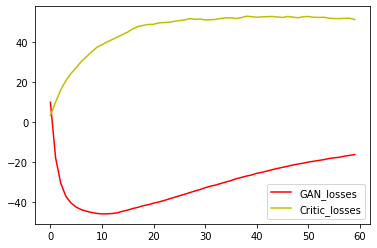

In [6]:
"""
Training of WGAN-GP
"""

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import time
from matplotlib import pyplot as plt
# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
BATCH_SIZE = 256
IMAGE_SIZE = 64
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 200
FEATURES_CRITIC = 16
FEATURES_GEN = 16
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10

transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.Grayscale(),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]),
    ]
)

train_dataset = datasets.ImageFolder(root="drive/MyDrive/summer_project/smalldata/train", transform=transforms)
#train_dataset = datasets.MNIST(root = './', transform=transforms, download = True)

# comment mnist above and uncomment below for training on CelebA
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

# initialize gen and disc, note: discriminator should be called critic,
# according to WGAN paper (since it no longer outputs between [0, 1])
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC).to(device)
initialize_weights(gen)
initialize_weights(critic)

# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

#for tensorboard plotting
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/GAN_MNIST/real")
writer_fake = SummaryWriter(f"logs/GAN_MNIST/fake")
step = 0

gen.train()
critic.train()

GAN_losses = []
Critic_losses = []

T1 = time.time()

for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    GAN_epoch_loss = 0
    GAN_cnt = 0
    Critic_epoch_loss = 0
    Critic_cnt = 0
    for batch_idx, (real, _) in enumerate(train_loader):
        real = real.to(device)
        cur_batch_size = real.shape[0]

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        # equivalent to minimizing the negative of that
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise)
            critic_real = critic(real).reshape(-1)
            critic_fake = critic(fake).reshape(-1)
            gp = gradient_penalty(critic, real, fake, device=device)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            )
            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

            GAN_epoch_loss = GAN_epoch_loss + loss_critic.item()
            GAN_cnt = GAN_cnt + 1

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        Critic_epoch_loss = Critic_epoch_loss + loss_gen.item()
        Critic_cnt = Critic_cnt + 1

        # Print losses occasionally and print to tensorboard
        if (batch_idx + 1) % 5 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx + 1}/{len(train_loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1
    GAN_epoch_loss = GAN_epoch_loss / GAN_cnt
    Critic_epoch_loss = Critic_epoch_loss / Critic_cnt
    GAN_losses.append(GAN_epoch_loss)
    Critic_losses.append(Critic_epoch_loss)
    if epoch % 10 == 0:
        print(epoch, "saved model")
        PATH = 'drive/MyDrive/summer_project/GAN_01.pth'
        torch.save(gen.state_dict(), PATH)
        PATH = 'drive/MyDrive/summer_project/CRITIC_01.pth'
        torch.save(critic.state_dict(), PATH)

# After this epoch
# Output the timer
T2 = time.time()
print('Using time: %fs' % (T2 - T1))
print('Training time per epoch: %.3f s' % ((T2 - T1)/(epoch + 1)))

# Output the Loss
# print(len(train_losses))
# print(len(val_losses))

# Plot the Loss
print(GAN_losses)
plt.plot(range(NUM_EPOCHS), GAN_losses,c = 'r',label = "GAN_losses")
plt.plot(range(NUM_EPOCHS), Critic_losses,c = 'y',label = "Critic_losses")
plt.legend(loc = 'best')
plt.show()